In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import harmonypy as hm
import seaborn as sns
import scrublet as scr
import bbknn as bk
%matplotlib inline

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
sc.settings.set_figure_params(dpi=250,fontsize=10)

In [4]:
adata = sc.read_h5ad("/rds/general/user/snb20/home/2_Organotypic_EC_Heterogeneity/Sanger_Datasets/Resolve/Test/Test2_nolog/bin50_D2-1.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 105486 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
adata.obs['arterial_smc'] = (adata.X[:,adata.var_names=='MYH11'] > 1) & (adata.X[:,adata.var_names=='TTN'] == 0)

In [7]:
adata_aec = adata[adata.obs['arterial_smc'] == True]

In [8]:
adata_aec

View of AnnData object with n_obs × n_vars = 3178 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [9]:
data = adata_aec.obs[['X_coor','Y_coor']]
linkage_data = linkage(data, method='average', metric='euclidean')

In [10]:
temp = dendrogram(linkage_data,no_plot=True)

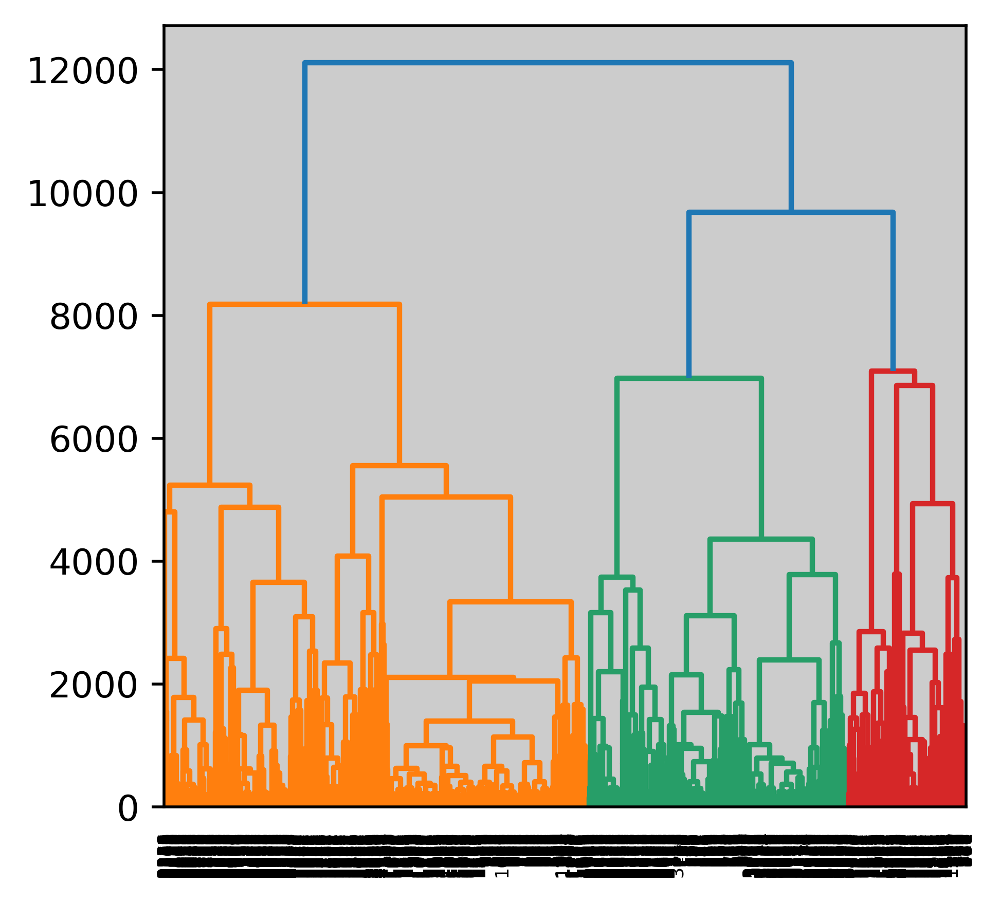

In [11]:
dendrogram(linkage_data)
plt.show()

In [12]:
adata_aec

View of AnnData object with n_obs × n_vars = 3178 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [13]:
# adjust n_clusters to relevant number of vessels
hierarchical_cluster = AgglomerativeClustering(n_clusters=1000, affinity='euclidean', linkage='single')

In [14]:
labels = hierarchical_cluster.fit_predict(data) 
print(labels)

[434 434 480 ... 480 480 278]


/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [15]:
adata_aec.obs['SMC_clusters'] = labels
adata_aec.obs['SMC_clusters'] = adata_aec.obs['SMC_clusters'].astype('category')

/var/tmp/pbs.7751763.pbs/ipykernel_479004/1883412233.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_aec.obs['SMC_clusters'] = labels
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


In [16]:
adata_aec.obs['SMC_clusters'].value_counts()

121    589
480    232
822     76
95      76
89      74
      ... 
488      1
489      1
491      1
492      1
999      1
Name: SMC_clusters, Length: 1000, dtype: int64

In [17]:
#1000
sc.pl.spatial(adata_aec,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

In [ ]:
#sc.pl.spatial(adata_aec,
              color=["SEMA3G","VWF","GJA5","ACKR1"],img_key='WGA',size=10, cmap = 'Wistia', vmax = 1)

In [18]:
# subset for clusters > 5 bins
adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist()

[121,
 480,
 822,
 95,
 89,
 44,
 79,
 310,
 439,
 41,
 232,
 107,
 81,
 38,
 78,
 47,
 14,
 159,
 11,
 54,
 30,
 135,
 6,
 46,
 105,
 409,
 116,
 380,
 175,
 117,
 18,
 62,
 443,
 16,
 189,
 127,
 200,
 31,
 85,
 410,
 884,
 435,
 154,
 37,
 115,
 181,
 169,
 36,
 229,
 75,
 49,
 119,
 103,
 165,
 445,
 225,
 32,
 25,
 148,
 235]

In [19]:
adata_aec_subset = adata_aec[adata_aec.obs.SMC_clusters.isin(adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist())]

In [20]:
adata_aec_subset.obs.SMC_clusters = adata_aec_subset.obs.SMC_clusters.astype(str).astype('category')

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/pandas/core/generic.py:5931: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value


In [21]:
adata_aec_subset

AnnData object with n_obs × n_vars = 1962 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [22]:
del adata_aec_subset.uns['SMC_clusters_colors']

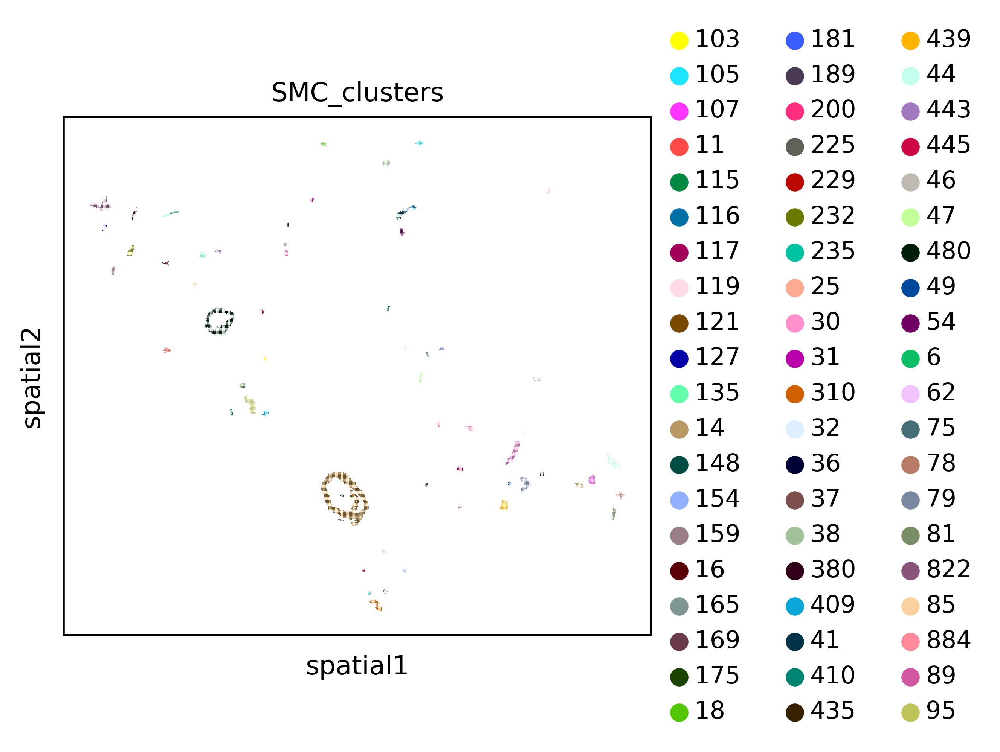

In [23]:
#500
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key=None,size=8, alpha_img = 0.2)

In [ ]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6)

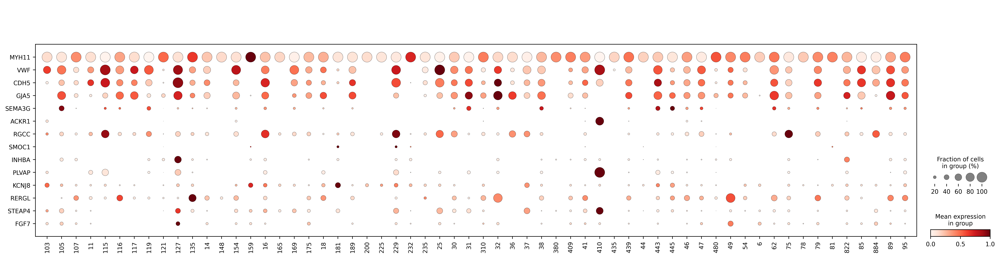

In [24]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","PLVAP","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [ ]:
# add gene percentage expressed to dataframe

In [25]:
adata_aec_subset.obs['RERGL_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='RERGL'] > 0)

In [26]:
adata_aec_subset.obs['STEAP4_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 0)

In [27]:
adata_aec_subset.obs['FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [28]:
adata_aec_subset.obs['KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [29]:
adata_aec_subset.obs['AGT_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='AGT'] > 0)

In [30]:
adata_aec_subset.obs['STEAP4_FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [31]:
adata_aec_subset.obs['STEAP4_KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [32]:
adata_aec_subset

AnnData object with n_obs × n_vars = 1962 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters', 'RERGL_percent', 'STEAP4_percent', 'FGF7_percent', 'KCNJ8_percent', 'AGT_percent', 'STEAP4_FGF7_percent', 'STEAP4_KCNJ8_percent'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [33]:
results = adata_aec_subset.obs[['RERGL_percent','STEAP4_percent','FGF7_percent','KCNJ8_percent','AGT_percent','STEAP4_FGF7_percent','STEAP4_KCNJ8_percent','SMC_clusters']].groupby('SMC_clusters').mean()

In [34]:
results

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent
SMC_clusters,,,,,,,
103,0.000000,0.166667,0.166667,0.333333,0.333333,0.000000,0.166667
105,0.058824,0.352941,0.235294,0.176471,0.117647,0.000000,0.000000
107,0.382353,0.088235,0.117647,0.117647,0.352941,0.029412,0.000000
11,0.210526,0.052632,0.052632,0.105263,0.526316,0.000000,0.000000
115,0.142857,0.000000,0.000000,0.142857,0.857143,0.000000,0.000000
116,0.500000,0.000000,0.000000,0.062500,0.750000,0.000000,0.000000
117,0.142857,0.000000,0.000000,0.071429,0.571429,0.000000,0.000000
119,0.142857,0.000000,0.000000,0.000000,0.571429,0.000000,0.000000
121,0.086587,0.008489,0.000000,0.050934,0.281834,0.000000,0.000000


In [35]:
matrix=pd.DataFrame(adata_aec_subset.X,columns=adata_aec_subset.raw.var.index,index=adata_aec_subset.obs.index)

In [36]:
matrix["SMC_clusters"] = adata_aec_subset.obs["SMC_clusters"]

In [37]:
matrix2 = matrix.replace(0, np.NaN)

In [38]:
df_mean_nonzero =matrix2.groupby("SMC_clusters").mean()

In [39]:
df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]

Genes,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,
103,NaN,5.000000,1.000000,1.000000,1.500000,NaN,2.000000,7.000000,NaN
105,1.000000,1.333333,1.000000,4.500000,1.333333,1.142857,NaN,1.600000,NaN
107,2.384615,1.333333,1.250000,3.083333,1.000000,1.000000,NaN,1.200000,NaN
11,1.000000,1.000000,1.000000,5.600000,1.000000,NaN,NaN,2.800000,NaN
115,1.000000,NaN,NaN,3.833333,1.000000,2.000000,NaN,3.800000,NaN
116,3.000000,NaN,NaN,3.500000,1.000000,2.000000,NaN,1.500000,NaN
117,1.000000,NaN,NaN,3.000000,1.000000,NaN,NaN,2.000000,NaN
119,1.000000,NaN,NaN,4.000000,NaN,1.000000,NaN,2.666667,NaN
121,1.156863,1.400000,NaN,2.397590,1.100000,1.000000,1.000000,1.000000,1.5


### add expression values to dataframe

In [40]:
#mean expression (expressing bins only / cluster)
test = pd.concat([results, df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]], axis = 1)

In [41]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,,,,,,,,
103,0.000000,0.166667,0.166667,0.333333,0.333333,0.000000,0.166667,NaN,5.000000,1.000000,1.000000,1.500000,NaN,2.000000,7.000000,NaN
105,0.058824,0.352941,0.235294,0.176471,0.117647,0.000000,0.000000,1.000000,1.333333,1.000000,4.500000,1.333333,1.142857,NaN,1.600000,NaN
107,0.382353,0.088235,0.117647,0.117647,0.352941,0.029412,0.000000,2.384615,1.333333,1.250000,3.083333,1.000000,1.000000,NaN,1.200000,NaN
11,0.210526,0.052632,0.052632,0.105263,0.526316,0.000000,0.000000,1.000000,1.000000,1.000000,5.600000,1.000000,NaN,NaN,2.800000,NaN
115,0.142857,0.000000,0.000000,0.142857,0.857143,0.000000,0.000000,1.000000,NaN,NaN,3.833333,1.000000,2.000000,NaN,3.800000,NaN
116,0.500000,0.000000,0.000000,0.062500,0.750000,0.000000,0.000000,3.000000,NaN,NaN,3.500000,1.000000,2.000000,NaN,1.500000,NaN
117,0.142857,0.000000,0.000000,0.071429,0.571429,0.000000,0.000000,1.000000,NaN,NaN,3.000000,1.000000,NaN,NaN,2.000000,NaN
119,0.142857,0.000000,0.000000,0.000000,0.571429,0.000000,0.000000,1.000000,NaN,NaN,4.000000,NaN,1.000000,NaN,2.666667,NaN
121,0.086587,0.008489,0.000000,0.050934,0.281834,0.000000,0.000000,1.156863,1.400000,NaN,2.397590,1.100000,1.000000,1.000000,1.000000,1.5


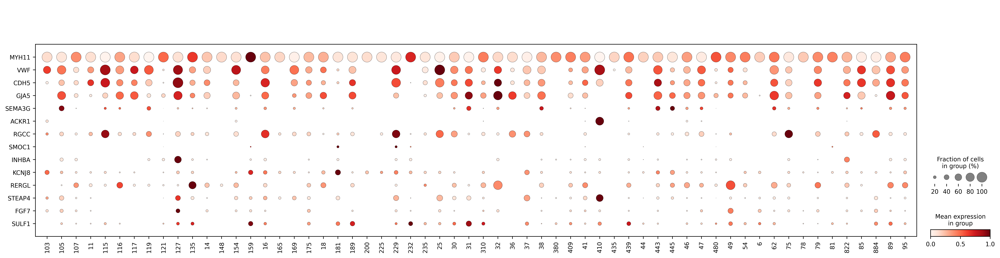

In [124]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","KCNJ8","RERGL","STEAP4","FGF7","SULF1"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [45]:
#add vessel type annotation column

In [105]:
test["Vessel"] = ['Vein','Artery','Artery','Unclear','Unclear','Artery','Artery','Artery','Artery','Unclear','Artery','Artery','Unclear','Unclear','Subendocardium','Unclear','Subendocardium','Artery','Artery','Artery','Unclear','Artery','Subendocardium','Unclear','Unclear','Subendocardium','Unclear','Unclear','Artery','Artery','Artery','Unclear','Unclear','Artery','Artery','Subendocardium','Artery','Artery','Vein','Subendocardium','Artery','Subendocardium','Artery','Artery','Unclear','Artery','Artery','Unclear','Unclear','Subendocardium','Artery','Artery','Subendocardium','Artery','Subendocardium','Artery','Artery','Unclear','Artery','Artery']

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


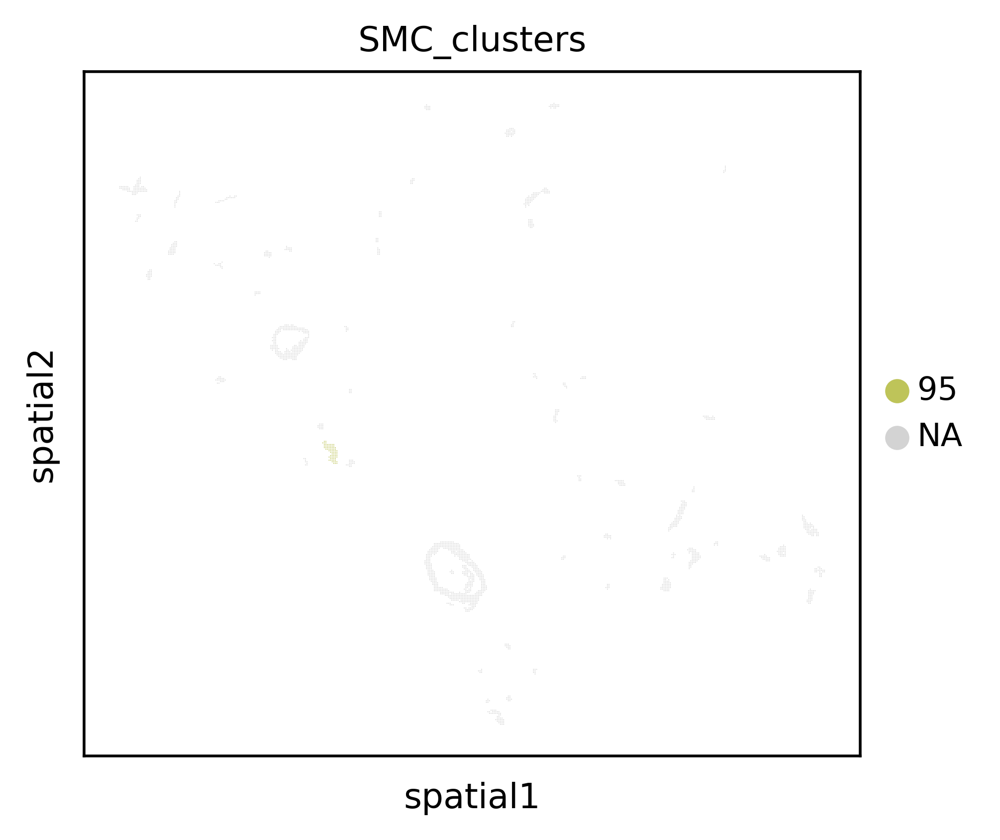

In [103]:
sc.pl.spatial(adata_aec_subset, color="SMC_clusters",img_key=None, size=6, alpha_img = 0.2, groups = ["95"])

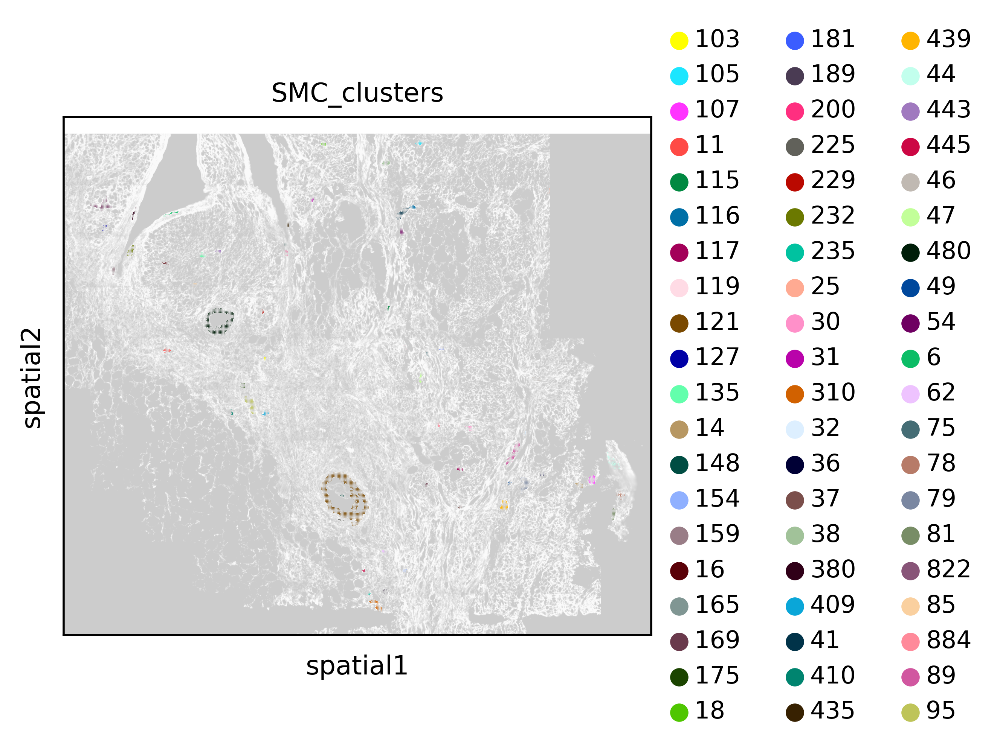

In [47]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6, alpha_img = 0.2)

In [ ]:
sc.pl.spatial(adata_aec_subset,
              color=["SEMA3G","VWF","GJA5","ACKR1"],img_key='WGA',size=10, cmap = 'plasma_r')

In [106]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel
SMC_clusters,,,,,,,,,,,,,,,,,
103,0.000000,0.166667,0.166667,0.333333,0.333333,0.000000,0.166667,NaN,5.000000,1.000000,1.000000,1.500000,NaN,2.000000,7.000000,NaN,Vein
105,0.058824,0.352941,0.235294,0.176471,0.117647,0.000000,0.000000,1.000000,1.333333,1.000000,4.500000,1.333333,1.142857,NaN,1.600000,NaN,Artery
107,0.382353,0.088235,0.117647,0.117647,0.352941,0.029412,0.000000,2.384615,1.333333,1.250000,3.083333,1.000000,1.000000,NaN,1.200000,NaN,Artery
11,0.210526,0.052632,0.052632,0.105263,0.526316,0.000000,0.000000,1.000000,1.000000,1.000000,5.600000,1.000000,NaN,NaN,2.800000,NaN,Unclear
115,0.142857,0.000000,0.000000,0.142857,0.857143,0.000000,0.000000,1.000000,NaN,NaN,3.833333,1.000000,2.000000,NaN,3.800000,NaN,Unclear
116,0.500000,0.000000,0.000000,0.062500,0.750000,0.000000,0.000000,3.000000,NaN,NaN,3.500000,1.000000,2.000000,NaN,1.500000,NaN,Artery
117,0.142857,0.000000,0.000000,0.071429,0.571429,0.000000,0.000000,1.000000,NaN,NaN,3.000000,1.000000,NaN,NaN,2.000000,NaN,Artery
119,0.142857,0.000000,0.000000,0.000000,0.571429,0.000000,0.000000,1.000000,NaN,NaN,4.000000,NaN,1.000000,NaN,2.666667,NaN,Artery
121,0.086587,0.008489,0.000000,0.050934,0.281834,0.000000,0.000000,1.156863,1.400000,NaN,2.397590,1.100000,1.000000,1.000000,1.000000,1.5,Artery


### add vessel size numbers

In [107]:
adata_aec_subset.obs.SMC_clusters.value_counts()

121    589
480    232
95      76
822     76
89      74
44      65
79      60
310     45
439     44
41      43
232     35
107     34
81      32
38      29
78      24
159     20
47      20
14      20
54      19
30      19
11      19
46      18
6       18
135     18
409     17
105     17
380     16
116     16
175     14
117     14
62      12
18      12
443     12
16      11
189     11
127     10
200      9
31       9
85       9
154      8
37       8
410      8
435      8
884      8
49       7
115      7
75       7
119      7
36       7
229      7
181      7
169      7
445      6
32       6
25       6
235      6
225      6
165      6
148      6
103      6
Name: SMC_clusters, dtype: int64

In [108]:
test2 = test.join(adata_aec_subset.obs['SMC_clusters'].value_counts(), on=None, how='left', lsuffix='', rsuffix='', sort=False, validate=None)

In [109]:
test2.columns = list(test2.columns[0:17]) + ['size']

In [110]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size
SMC_clusters,,,,,,,,,,,,,,,,,,
103,0.000000,0.166667,0.166667,0.333333,0.333333,0.000000,0.166667,NaN,5.000000,1.000000,1.000000,1.500000,NaN,2.000000,7.000000,NaN,Vein,6
105,0.058824,0.352941,0.235294,0.176471,0.117647,0.000000,0.000000,1.000000,1.333333,1.000000,4.500000,1.333333,1.142857,NaN,1.600000,NaN,Artery,17
107,0.382353,0.088235,0.117647,0.117647,0.352941,0.029412,0.000000,2.384615,1.333333,1.250000,3.083333,1.000000,1.000000,NaN,1.200000,NaN,Artery,34
11,0.210526,0.052632,0.052632,0.105263,0.526316,0.000000,0.000000,1.000000,1.000000,1.000000,5.600000,1.000000,NaN,NaN,2.800000,NaN,Unclear,19
115,0.142857,0.000000,0.000000,0.142857,0.857143,0.000000,0.000000,1.000000,NaN,NaN,3.833333,1.000000,2.000000,NaN,3.800000,NaN,Unclear,7
116,0.500000,0.000000,0.000000,0.062500,0.750000,0.000000,0.000000,3.000000,NaN,NaN,3.500000,1.000000,2.000000,NaN,1.500000,NaN,Artery,16
117,0.142857,0.000000,0.000000,0.071429,0.571429,0.000000,0.000000,1.000000,NaN,NaN,3.000000,1.000000,NaN,NaN,2.000000,NaN,Artery,14
119,0.142857,0.000000,0.000000,0.000000,0.571429,0.000000,0.000000,1.000000,NaN,NaN,4.000000,NaN,1.000000,NaN,2.666667,NaN,Artery,7
121,0.086587,0.008489,0.000000,0.050934,0.281834,0.000000,0.000000,1.156863,1.400000,NaN,2.397590,1.100000,1.000000,1.000000,1.000000,1.5,Artery,589


In [111]:
group=pd.Series("Large", index=test2.index)

In [112]:
group[test2["size"] <= 30] = "Small"

In [113]:
group

SMC_clusters
103    Small
105    Small
107    Large
11     Small
115    Small
116    Small
117    Small
119    Small
121    Large
127    Small
135    Small
14     Small
148    Small
154    Small
159    Small
16     Small
165    Small
169    Small
175    Small
18     Small
181    Small
189    Small
200    Small
225    Small
229    Small
232    Large
235    Small
25     Small
30     Small
31     Small
310    Large
32     Small
36     Small
37     Small
38     Small
380    Small
409    Small
41     Large
410    Small
435    Small
439    Large
44     Large
443    Small
445    Small
46     Small
47     Small
480    Large
49     Small
54     Small
6      Small
62     Small
75     Small
78     Small
79     Large
81     Large
822    Large
85     Small
884    Small
89     Large
95     Large
dtype: object

In [114]:
test2["group"] = group

In [115]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group
SMC_clusters,,,,,,,,,,,,,,,,,,,
103,0.000000,0.166667,0.166667,0.333333,0.333333,0.000000,0.166667,NaN,5.000000,1.000000,1.000000,1.500000,NaN,2.000000,7.000000,NaN,Vein,6,Small
105,0.058824,0.352941,0.235294,0.176471,0.117647,0.000000,0.000000,1.000000,1.333333,1.000000,4.500000,1.333333,1.142857,NaN,1.600000,NaN,Artery,17,Small
107,0.382353,0.088235,0.117647,0.117647,0.352941,0.029412,0.000000,2.384615,1.333333,1.250000,3.083333,1.000000,1.000000,NaN,1.200000,NaN,Artery,34,Large
11,0.210526,0.052632,0.052632,0.105263,0.526316,0.000000,0.000000,1.000000,1.000000,1.000000,5.600000,1.000000,NaN,NaN,2.800000,NaN,Unclear,19,Small
115,0.142857,0.000000,0.000000,0.142857,0.857143,0.000000,0.000000,1.000000,NaN,NaN,3.833333,1.000000,2.000000,NaN,3.800000,NaN,Unclear,7,Small
116,0.500000,0.000000,0.000000,0.062500,0.750000,0.000000,0.000000,3.000000,NaN,NaN,3.500000,1.000000,2.000000,NaN,1.500000,NaN,Artery,16,Small
117,0.142857,0.000000,0.000000,0.071429,0.571429,0.000000,0.000000,1.000000,NaN,NaN,3.000000,1.000000,NaN,NaN,2.000000,NaN,Artery,14,Small
119,0.142857,0.000000,0.000000,0.000000,0.571429,0.000000,0.000000,1.000000,NaN,NaN,4.000000,NaN,1.000000,NaN,2.666667,NaN,Artery,7,Small
121,0.086587,0.008489,0.000000,0.050934,0.281834,0.000000,0.000000,1.156863,1.400000,NaN,2.397590,1.100000,1.000000,1.000000,1.000000,1.5,Artery,589,Large


In [116]:
test2["vessel_size"] = test2["Vessel"] + "_" + test2["group"]

In [117]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size
SMC_clusters,,,,,,,,,,,,,,,,,,,,
103,0.000000,0.166667,0.166667,0.333333,0.333333,0.000000,0.166667,NaN,5.000000,1.000000,1.000000,1.500000,NaN,2.000000,7.000000,NaN,Vein,6,Small,Vein_Small
105,0.058824,0.352941,0.235294,0.176471,0.117647,0.000000,0.000000,1.000000,1.333333,1.000000,4.500000,1.333333,1.142857,NaN,1.600000,NaN,Artery,17,Small,Artery_Small
107,0.382353,0.088235,0.117647,0.117647,0.352941,0.029412,0.000000,2.384615,1.333333,1.250000,3.083333,1.000000,1.000000,NaN,1.200000,NaN,Artery,34,Large,Artery_Large
11,0.210526,0.052632,0.052632,0.105263,0.526316,0.000000,0.000000,1.000000,1.000000,1.000000,5.600000,1.000000,NaN,NaN,2.800000,NaN,Unclear,19,Small,Unclear_Small
115,0.142857,0.000000,0.000000,0.142857,0.857143,0.000000,0.000000,1.000000,NaN,NaN,3.833333,1.000000,2.000000,NaN,3.800000,NaN,Unclear,7,Small,Unclear_Small
116,0.500000,0.000000,0.000000,0.062500,0.750000,0.000000,0.000000,3.000000,NaN,NaN,3.500000,1.000000,2.000000,NaN,1.500000,NaN,Artery,16,Small,Artery_Small
117,0.142857,0.000000,0.000000,0.071429,0.571429,0.000000,0.000000,1.000000,NaN,NaN,3.000000,1.000000,NaN,NaN,2.000000,NaN,Artery,14,Small,Artery_Small
119,0.142857,0.000000,0.000000,0.000000,0.571429,0.000000,0.000000,1.000000,NaN,NaN,4.000000,NaN,1.000000,NaN,2.666667,NaN,Artery,7,Small,Artery_Small
121,0.086587,0.008489,0.000000,0.050934,0.281834,0.000000,0.000000,1.156863,1.400000,NaN,2.397590,1.100000,1.000000,1.000000,1.000000,1.5,Artery,589,Large,Artery_Large


In [118]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### add ROI numbers

In [121]:
test2.index = ['ROI_D2-1_' + str(i) for i in test2.index.tolist()]

In [122]:
test2["ROI"] = "D2-1"

In [123]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size,ROI
ROI_D2-1_103,0.000000,0.166667,0.166667,0.333333,0.333333,0.000000,0.166667,NaN,5.000000,1.000000,1.000000,1.500000,NaN,2.000000,7.000000,NaN,Vein,6,Small,Vein_Small,D2-1
ROI_D2-1_105,0.058824,0.352941,0.235294,0.176471,0.117647,0.000000,0.000000,1.000000,1.333333,1.000000,4.500000,1.333333,1.142857,NaN,1.600000,NaN,Artery,17,Small,Artery_Small,D2-1
ROI_D2-1_107,0.382353,0.088235,0.117647,0.117647,0.352941,0.029412,0.000000,2.384615,1.333333,1.250000,3.083333,1.000000,1.000000,NaN,1.200000,NaN,Artery,34,Large,Artery_Large,D2-1
ROI_D2-1_11,0.210526,0.052632,0.052632,0.105263,0.526316,0.000000,0.000000,1.000000,1.000000,1.000000,5.600000,1.000000,NaN,NaN,2.800000,NaN,Unclear,19,Small,Unclear_Small,D2-1
ROI_D2-1_115,0.142857,0.000000,0.000000,0.142857,0.857143,0.000000,0.000000,1.000000,NaN,NaN,3.833333,1.000000,2.000000,NaN,3.800000,NaN,Unclear,7,Small,Unclear_Small,D2-1
ROI_D2-1_116,0.500000,0.000000,0.000000,0.062500,0.750000,0.000000,0.000000,3.000000,NaN,NaN,3.500000,1.000000,2.000000,NaN,1.500000,NaN,Artery,16,Small,Artery_Small,D2-1
ROI_D2-1_117,0.142857,0.000000,0.000000,0.071429,0.571429,0.000000,0.000000,1.000000,NaN,NaN,3.000000,1.000000,NaN,NaN,2.000000,NaN,Artery,14,Small,Artery_Small,D2-1
ROI_D2-1_119,0.142857,0.000000,0.000000,0.000000,0.571429,0.000000,0.000000,1.000000,NaN,NaN,4.000000,NaN,1.000000,NaN,2.666667,NaN,Artery,7,Small,Artery_Small,D2-1
ROI_D2-1_121,0.086587,0.008489,0.000000,0.050934,0.281834,0.000000,0.000000,1.156863,1.400000,NaN,2.397590,1.100000,1.000000,1.000000,1.000000,1.5,Artery,589,Large,Artery_Large,D2-1
ROI_D2-1_127,0.100000,0.400000,0.300000,0.200000,0.700000,0.300000,0.000000,1.000000,4.250000,4.333333,4.428571,1.000000,1.000000,NaN,1.250000,NaN,Unclear,10,Small,Unclear_Small,D2-1


In [ ]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL_percent", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL percentage expression')

In [ ]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL mean expression')

In [ ]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4_percent", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 percentage expression')

In [ ]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 mean expression')

In [ ]:
sns.boxplot(data = test, x = "Vessel", y = "KCNJ8_percent", palette = 'Greens', order = ['Artery','Vein']).set(title='KCNJ8 percentage expression')

In [ ]:
sns.boxplot(data = test, x = "Vessel", y = "KCNJ8", palette = 'Greens', order = ['Artery','Vein']).set(title='KCNJ8 mean expression')

In [ ]:
test

In [ ]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4_KCNJ8_percent", palette = 'Purples', order = ['Artery','Vein']).set(title='STEAP4/KCNJ8 percent expression')